In [1]:
import pandas as pd
from pandas.plotting import scatter_matrix
import matplotlib.pyplot as plt
from sklearn import model_selection
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix
from sklearn.metrics import accuracy_score
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.naive_bayes import GaussianNB
from sklearn.svm import SVC
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import LogisticRegression
import numpy as np
import pandas as pd
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import f1_score
from sklearn.metrics import accuracy_score
%matplotlib inline
import seaborn as sns
import pandas as pd
from sklearn.naive_bayes import GaussianNB
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from sklearn import preprocessing
from sklearn.metrics import confusion_matrix

from sklearn.ensemble import RandomForestClassifier

In [2]:
df=pd.read_csv("file:///F:/cereal.csv")
df.head()

,name,mfr,type,calories,protein,fat,sodium,fiber,carbo,sugars,potass,vitamins,shelf,weight,cups,rating
0,100% Bran,N,C,70,4,1,130,10.0,5.0,6,280,25,3,1.0,0.33,68.402973
1,100% Natural Bran,Q,C,120,3,5,15,2.0,8.0,8,135,0,3,1.0,1.00,33.983679
2,All-Bran,K,C,70,4,1,260,9.0,7.0,5,320,25,3,1.0,0.33,59.425505
3,All-Bran with Extra Fiber,K,C,50,4,0,140,14.0,8.0,0,330,25,3,1.0,0.50,93.704912
4,Almond Delight,R,C,110,2,2,200,1.0,14.0,8,-1,25,3,1.0,0.75,34.384843


In [3]:
df.shape

(77, 16)

In [4]:
df.describe()

,calories,protein,fat,sodium,fiber,carbo,sugars,potass,vitamins,shelf,weight,cups,rating
count,77.000000,77.000000,77.000000,77.000000,77.000000,77.000000,77.000000,77.000000,77.000000,77.000000,77.000000,77.000000,77.000000
mean,106.883117,2.545455,1.012987,159.675325,2.151948,14.597403,6.922078,96.077922,28.246753,2.207792,1.029610,0.821039,42.665705
std,19.484119,1.094790,1.006473,83.832295,2.383364,4.278956,4.444885,71.286813,22.342523,0.832524,0.150477,0.232716,14.047289
min,50.000000,1.000000,0.000000,0.000000,0.000000,-1.000000,-1.000000,-1.000000,0.000000,1.000000,0.500000,0.250000,18.042851
25%,100.000000,2.000000,0.000000,130.000000,1.000000,12.000000,3.000000,40.000000,25.000000,1.000000,1.000000,0.670000,33.174094
50%,110.000000,3.000000,1.000000,180.000000,2.000000,14.000000,7.000000,90.000000,25.000000,2.000000,1.000000,0.750000,40.400208
75%,110.000000,3.000000,2.000000,210.000000,3.000000,17.000000,11.000000,120.000000,25.000000,3.000000,1.000000,1.000000,50.828392
max,160.000000,6.000000,5.000000,320.000000,14.000000,23.000000,15.000000,330.000000,100.000000,3.000000,1.500000,1.500000,93.704912


In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 77 entries, 0 to 76
Data columns (total 16 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   name      77 non-null     object 
 1   mfr       77 non-null     object 
 2   type      77 non-null     object 
 3   calories  77 non-null     int64  
 4   protein   77 non-null     int64  
 5   fat       77 non-null     int64  
 6   sodium    77 non-null     int64  
 7   fiber     77 non-null     float64
 8   carbo     77 non-null     float64
 9   sugars    77 non-null     int64  
 10  potass    77 non-null     int64  
 11  vitamins  77 non-null     int64  
 12  shelf     77 non-null     int64  
 13  weight    77 non-null     float64
 14  cups      77 non-null     float64
 15  rating    77 non-null     float64
dtypes: float64(5), int64(8), object(3)
memory usage: 9.8+ KB


In [6]:
df.isnull().sum()

name        0
mfr         0
type        0
calories    0
protein     0
fat         0
sodium      0
fiber       0
carbo       0
sugars      0
potass      0
vitamins    0
shelf       0
weight      0
cups        0
rating      0
dtype: int64

Text(0.5, 1.0, 'distribution of cereals by type')

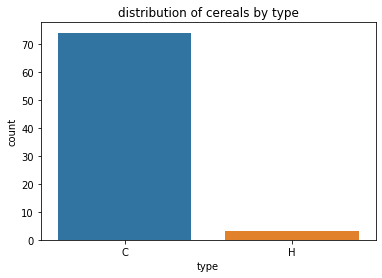

In [8]:
sns.countplot(df["type"]).set_title("distribution of cereals by type")

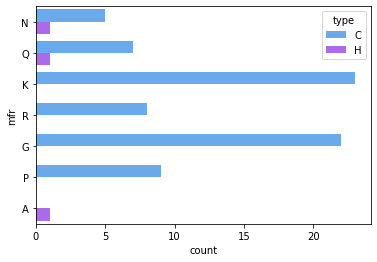

In [9]:
sns.countplot(y = 'mfr' , hue = 'type' , data=df , palette ='cool')

In [10]:
df.drop_duplicates()

,name,mfr,type,calories,protein,fat,sodium,fiber,carbo,sugars,potass,vitamins,shelf,weight,cups,rating
0,100% Bran,N,C,70,4,1,130,10.0,5.0,6,280,25,3,1.0,0.33,68.402973
1,100% Natural Bran,Q,C,120,3,5,15,2.0,8.0,8,135,0,3,1.0,1.00,33.983679
2,All-Bran,K,C,70,4,1,260,9.0,7.0,5,320,25,3,1.0,0.33,59.425505
3,All-Bran with Extra Fiber,K,C,50,4,0,140,14.0,8.0,0,330,25,3,1.0,0.50,93.704912
4,Almond Delight,R,C,110,2,2,200,1.0,14.0,8,-1,25,3,1.0,0.75,34.384843
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
72,Triples,G,C,110,2,1,250,0.0,21.0,3,60,25,3,1.0,0.75,39.106174
73,Trix,G,C,110,1,1,140,0.0,13.0,12,25,25,2,1.0,1.00,27.753301
74,Wheat Chex,R,C,100,3,1,230,3.0,17.0,3,115,25,1,1.0,0.67,49.787445
75,Wheaties,G,C,100,3,1,200,3.0,17.0,3,110,25,1,1.0,1.00,51.592193


In [11]:
df.shape

(77, 16)

In [12]:
pd.DataFrame(df['mfr'].value_counts())

,mfr
K,23
G,22
P,9
Q,8
R,8
N,6
A,1


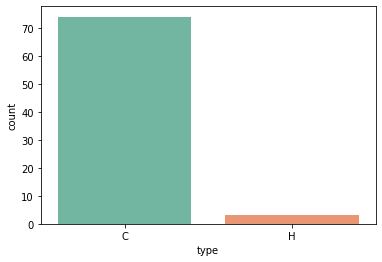

In [18]:
sns.countplot(x="type", data=df, palette="Set2")

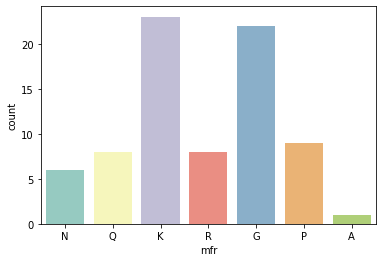

In [17]:
sns.countplot(x="mfr", data=df, palette="Set3")

In [19]:
df.rating.describe()

count    77.000000
mean     42.665705
std      14.047289
min      18.042851
25%      33.174094
50%      40.400208
75%      50.828392
max      93.704912
Name: rating, dtype: float64

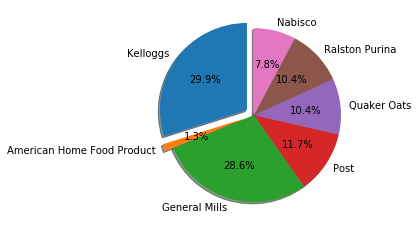

In [20]:
labels = 'Kelloggs', 'American Home Food Product','General Mills','Post', 'Quaker Oats', 'Ralston Purina', 'Nabisco'
sizes = [23,1,22,9,8,8,6]
explode = (0.1,0.1,0,0,0,0,0)
plt.pie(sizes, labels=labels,shadow = True, startangle=90, explode = explode, autopct='%1.1f%%')
plt.show()

Text(0.5, 1.0, 'PRODUCTS DIVERSITY')

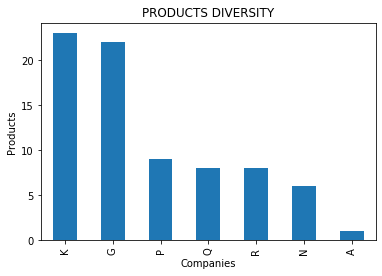

In [21]:
mfr_counts = df['mfr'].value_counts()
mfr_counts.plot(kind='bar')
plt.xlabel("Companies")
plt.ylabel("Products")
plt.title("PRODUCTS DIVERSITY")

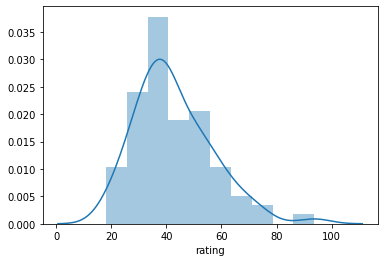

In [24]:
sns.distplot(df['rating'])

In [25]:
df.columns

Index(['name', 'mfr', 'type', 'calories', 'protein', 'fat', 'sodium', 'fiber',
       'carbo', 'sugars', 'potass', 'vitamins', 'shelf', 'weight', 'cups',
       'rating'],
      dtype='object')

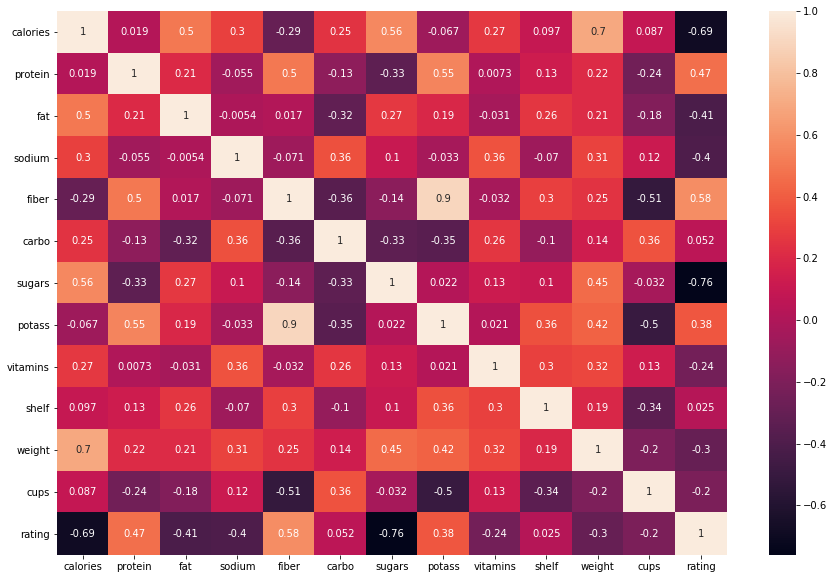

In [28]:
plt.figure(figsize=(15,10))
sns.heatmap(df.corr(),annot=True)

In [29]:
df['type'].unique()

array(['C', 'H'], dtype=object)

In [30]:
df['type'].unique().size

2

In [34]:
df['name'][df['type'] == 'C'].count()

74

In [35]:
df['name'][df['type'] == 'H'].count()

3

In [36]:
df['mfr'].unique()

array(['N', 'Q', 'K', 'R', 'G', 'P', 'A'], dtype=object)

In [37]:
df['name'][df['type']=='Q'].count()

0

In [38]:
df['name'][df['mfr'] == 'Q'].count() 

8

In [39]:
df['name'][df['mfr'] == 'K'].count()

23

In [40]:
df['name'][df['mfr'] == 'R'].count()

8

In [41]:
df['name'][df['mfr'] == 'G'].count() 

22

In [42]:
df['name'][df['mfr'] == 'P'].count()

9

In [43]:
print(df['shelf'].unique())
print(df['shelf'].unique().size)

[3 1 2]
3


In [44]:
print(df['name'][df['shelf'] == 1].count())
print(df['name'][df['shelf'] == 2].count())
print(df['name'][df['shelf'] == 3].count())

20
21
36


In [45]:
df.head()

,name,mfr,type,calories,protein,fat,sodium,fiber,carbo,sugars,potass,vitamins,shelf,weight,cups,rating
0,100% Bran,N,C,70,4,1,130,10.0,5.0,6,280,25,3,1.0,0.33,68.402973
1,100% Natural Bran,Q,C,120,3,5,15,2.0,8.0,8,135,0,3,1.0,1.00,33.983679
2,All-Bran,K,C,70,4,1,260,9.0,7.0,5,320,25,3,1.0,0.33,59.425505
3,All-Bran with Extra Fiber,K,C,50,4,0,140,14.0,8.0,0,330,25,3,1.0,0.50,93.704912
4,Almond Delight,R,C,110,2,2,200,1.0,14.0,8,-1,25,3,1.0,0.75,34.384843


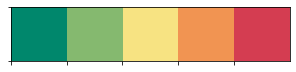

In [46]:
cols= ['#00876c','#85b96f','#f7e382','#f19452','#d43d51']
sns.palplot(cols)

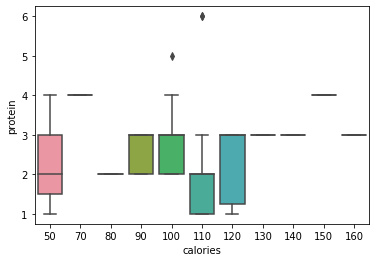

In [47]:
sns.boxplot(x="calories",y="protein", data=df)
plt.show()

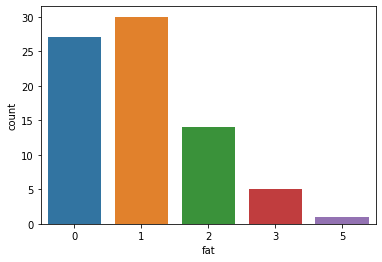

In [49]:
sns.countplot(x="fat",data=df)

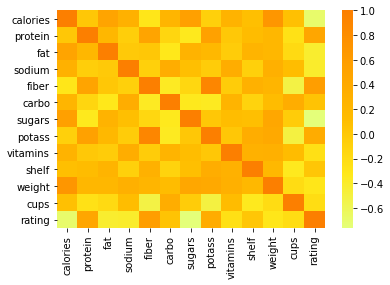

In [51]:
sns.heatmap(df.corr(),cmap='Wistia')

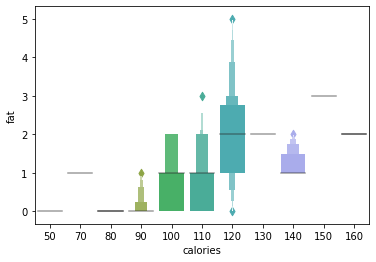

In [53]:
sns.boxenplot(x="calories",y="fat", data=df)
plt.show()

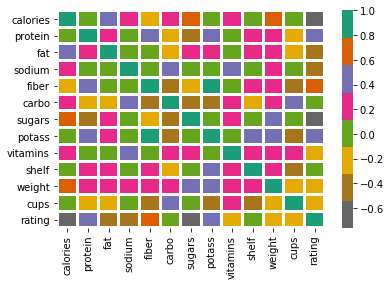

In [54]:
sns.heatmap(df.corr(),cmap='Dark2_r',linewidths=2)

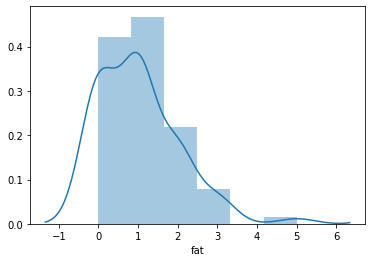

In [56]:
sns.distplot(df['fat'])

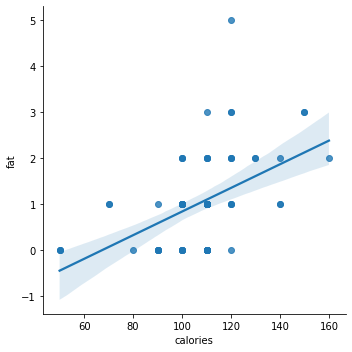

In [57]:
sns.lmplot(x="calories",y="fat", data=df)
plt.show()

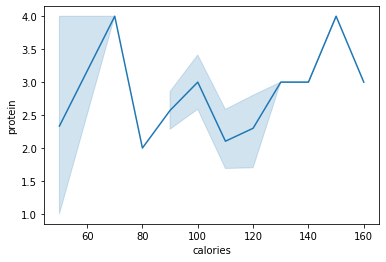

In [58]:
sns.lineplot(x="calories",y="protein", data=df)
plt.show()

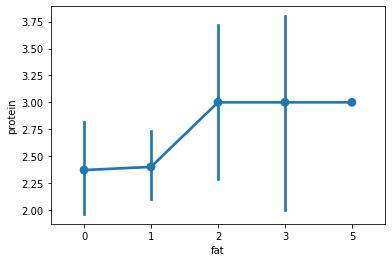

In [59]:
sns.pointplot(x="fat",y="protein", data=df)
plt.show()

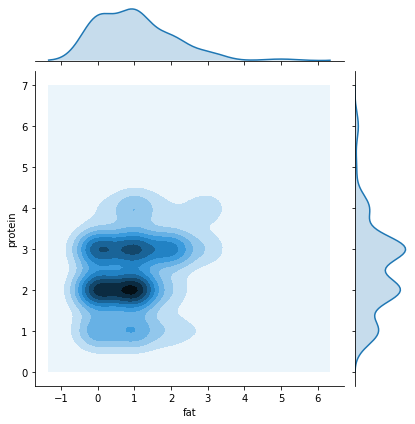

In [60]:
sns.jointplot(x='fat',y='protein',data=df,kind='kde')

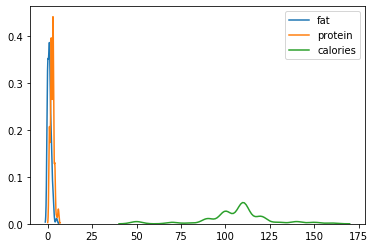

In [62]:
sns.kdeplot(df['fat'])
sns.kdeplot(df['protein'])
sns.kdeplot(df['calories'])


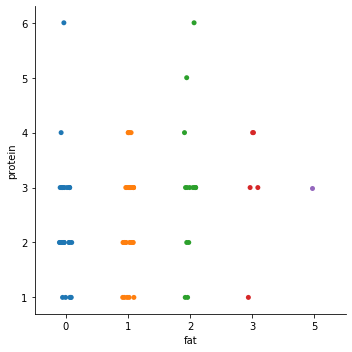

In [64]:
sns.catplot(x='fat',y='protein',data=df)

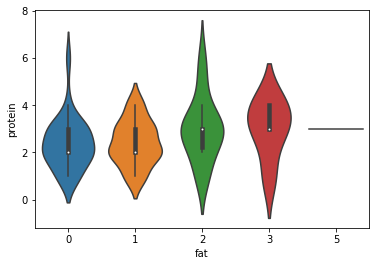

In [65]:
sns.violinplot(x='fat',y='protein',data=df,kind='kde')

In [66]:
import sweetviz as sv

In [68]:
data=sv.analyze(df)
data.show_html('Analyze.html')

                                             |          | [  0%]   00:00 -> (? left)

Report Analyze.html was generated! NOTEBOOK/COLAB USERS: the web browser MAY not pop up, regardless, the report IS saved in your notebook/colab files.


In [69]:
from IPython.display import IFrame

In [70]:
IFrame(src='Analyze.html',width=1000,height=600)

In [71]:
from dataprep.eda import *

C:\Users\Md Asif Ikbal\anaconda3\lib\site-packages\dask\dataframe\accessor.py:48: FutureWarning: The default value of regex will change from True to False in a future version.
  out = getattr(getattr(obj, accessor, obj), attr)(*args, **kwargs)
C:\Users\Md Asif Ikbal\anaconda3\lib\site-packages\dask\dataframe\accessor.py:48: FutureWarning: The default value of regex will change from True to False in a future version.
  out = getattr(getattr(obj, accessor, obj), attr)(*args, **kwargs)
C:\Users\Md Asif Ikbal\anaconda3\lib\site-packages\dask\dataframe\accessor.py:48: FutureWarning: The default value of regex will change from True to False in a future version.
  out = getattr(getattr(obj, accessor, obj), attr)(*args, **kwargs)


  0%|          | 0/2202 [00:00<?, ?it/s]

C:\Users\Md Asif Ikbal\anaconda3\lib\site-packages\dask\dataframe\accessor.py:48: FutureWarning: The default value of regex will change from True to False in a future version.
  out = getattr(getattr(obj, accessor, obj), attr)(*args, **kwargs)
C:\Users\Md Asif Ikbal\anaconda3\lib\site-packages\dask\dataframe\accessor.py:48: FutureWarning: The default value of regex will change from True to False in a future version.
  out = getattr(getattr(obj, accessor, obj), attr)(*args, **kwargs)


DataPrep Report
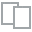
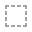
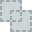
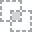
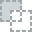
...
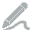
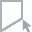
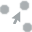
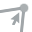
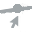

In [72]:
create_report(df)

In [73]:
from sklearn.preprocessing import MinMaxScaler

In [74]:
df.columns

Index(['name', 'mfr', 'type', 'calories', 'protein', 'fat', 'sodium', 'fiber',
       'carbo', 'sugars', 'potass', 'vitamins', 'shelf', 'weight', 'cups',
       'rating'],
      dtype='object')

In [77]:
df.head()

,name,mfr,type,calories,protein,fat,sodium,fiber,carbo,sugars,potass,vitamins,shelf,weight,cups,rating
0,100% Bran,N,C,70,4,1,130,10.0,5.0,6,280,25,3,1.0,0.33,68.402973
1,100% Natural Bran,Q,C,120,3,5,15,2.0,8.0,8,135,0,3,1.0,1.00,33.983679
2,All-Bran,K,C,70,4,1,260,9.0,7.0,5,320,25,3,1.0,0.33,59.425505
3,All-Bran with Extra Fiber,K,C,50,4,0,140,14.0,8.0,0,330,25,3,1.0,0.50,93.704912
4,Almond Delight,R,C,110,2,2,200,1.0,14.0,8,-1,25,3,1.0,0.75,34.384843


In [78]:
maiin=MinMaxScaler()
data=[ 'calories', 'protein', 'fat', 'sodium', 'fiber',
       'carbo', 'sugars', 'potass', 'vitamins', 'shelf', 'weight', 'cups',
       'rating']
df[data]=maiin.fit_transform(data)
df[data]

ValueError: could not convert string to float: 'calories'

In [79]:
df

,name,mfr,type,calories,protein,fat,sodium,fiber,carbo,sugars,potass,vitamins,shelf,weight,cups,rating
0,100% Bran,N,C,70,4,1,130,10.0,5.0,6,280,25,3,1.0,0.33,68.402973
1,100% Natural Bran,Q,C,120,3,5,15,2.0,8.0,8,135,0,3,1.0,1.00,33.983679
2,All-Bran,K,C,70,4,1,260,9.0,7.0,5,320,25,3,1.0,0.33,59.425505
3,All-Bran with Extra Fiber,K,C,50,4,0,140,14.0,8.0,0,330,25,3,1.0,0.50,93.704912
4,Almond Delight,R,C,110,2,2,200,1.0,14.0,8,-1,25,3,1.0,0.75,34.384843
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
72,Triples,G,C,110,2,1,250,0.0,21.0,3,60,25,3,1.0,0.75,39.106174
73,Trix,G,C,110,1,1,140,0.0,13.0,12,25,25,2,1.0,1.00,27.753301
74,Wheat Chex,R,C,100,3,1,230,3.0,17.0,3,115,25,1,1.0,0.67,49.787445
75,Wheaties,G,C,100,3,1,200,3.0,17.0,3,110,25,1,1.0,1.00,51.592193


In [80]:
type(df[''])

AttributeError: 'Series' object has no attribute 'dtyps'